## **Future analysis of agricultural land fertility in Europe and Asia.**
## Crop lands classification

## Import libraries and modules 

This section includes import of
* Python libraries
* modules available in the repository

In [1]:
import sys, os
sys.path.append('../src/')
import load_data, plotting, utils

sys.path.append('../src/models/')
import crop_classifier

from xgboost import XGBClassifier
import pickle
import json

import warnings
warnings.filterwarnings("ignore")

## Data source 

All the data used in research was obtained with Gogle Earth Engine.

Nevertheless, to simplify the access we loaded all data to [Google Drive folder](https://drive.google.com/drive/folders/1reYmmjR6ckznwakdeLyAC6DVKp3Adp2y?usp=sharing). Below this folder is refered to as `path`.

In [2]:
path = os.path.join('..', 'Geo_data')
path_pics = os.path.join(path, 'Crop_Eurasia', 'Geo_pics')
if not os.path.exists(path_pics):
    os.makedirs(path_pics)

<a id="target-audience"></a>
## Set the dates. Load data

Here the user specifies the desired years for the analysis. If the data was taken from Google Drive linked above, please pay attention on years ranges available (listed in [README file](https://github.com/DariaTan/ArableLand2/blob/main/README.md)).

In [3]:
# If stop_year is not defined, start year goes to collection only
year_start_train = 2006
year_stop_train = 2009

year_start_test = 2017
year_start_future = 2025

# Land cover time lag (years)
lag = 1

# Lis of CMIP simulations used
CMIPs = ['CNRM-CM5', 'GFDL-CM3', 'MPI-ESM-MR']

With he years defined, we collect the data from source .tif files in those years.

Elevation doesn't have year affiliaion.
Other values are loading separately in train, test and future sets. Future climate here has a specific procedure since it units the outputs of 3 CMIP5 simulations.

LC is the target variable. So, we have it in train and test, but do not have in future.

In [6]:
# Elevation
Elv = load_data.elevation(path)

# Land cover historical feature
LC_feature_train = load_data.land_cover(path = path, year_start = year_start_train - 5, year_stop = year_stop_train - 5)
LC_feature_test = load_data.land_cover(path = path, year_start = year_start_test - 5)
LC_feature_future = load_data.land_cover(path = path, year_start = year_start_future - 5)

# Climate
Climate_train, years_train = load_data.climate(path = path, year_start = year_start_train, year_stop = year_stop_train)
Climate_test, years_test = load_data.climate(path = path, year_start = year_start_test)

# Climate future
Climate_future = dict.fromkeys(CMIPs)
for CMIP in CMIPs:
    Climate_future[CMIP], years_future = load_data.climate(path = path, year_start = year_start_future, CMIP = CMIP)

# Land cover target feature
LC_train = load_data.land_cover(path = path, year_start = year_start_train + lag, year_stop = year_stop_train + lag)
LC_test = load_data.land_cover(path = path, year_start = year_start_test + lag)

Land cover dictionary is collected for 3 year(s)
Land cover dictionary is collected for 1 year(s)
Land cover dictionary is collected for 1 year(s)


  0%|          | 0/3 [04:00<?, ?it/s]


RasterioIOError: ../Geo_data/Crop_Eurasia/Climate/tmmx_2006.tif: No such file or directory

<a id="eda"></a>
#### Data analysis

The plot below shows the distributions of biovariables (values calculated based on climate data) of test and future periods. It was created to be sure in the concidence of two data sources.

11it [01:39,  9.04s/it]


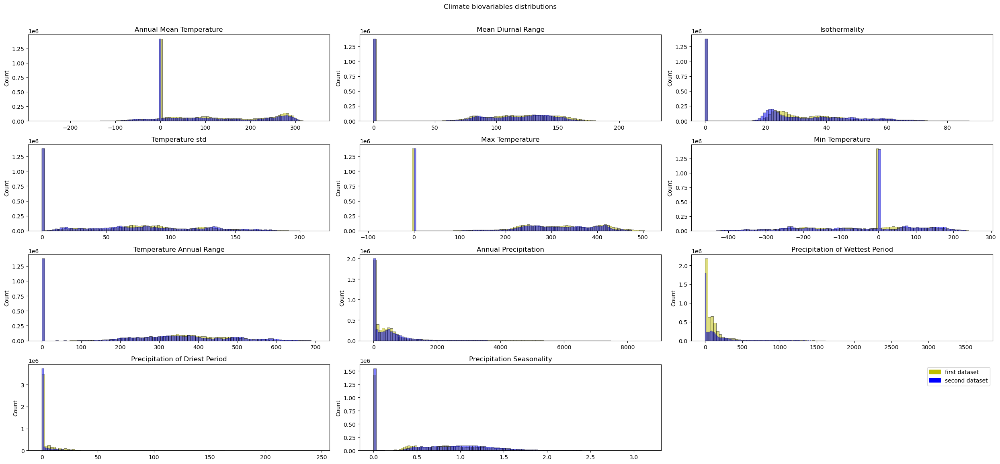

In [91]:
plotting.plot_biovars_dist(Climate_test, Climate_future['CNRM-CM5'])

Next figure displays the density distribution of certain biovariables for the samples that nine years later either lost their crop production status (marked as red) or acquired it (marked as green). It is evident that the profiles of the features exhibit a distinct shift that is likely to assist the model in its training.

6it [00:01,  3.49it/s]


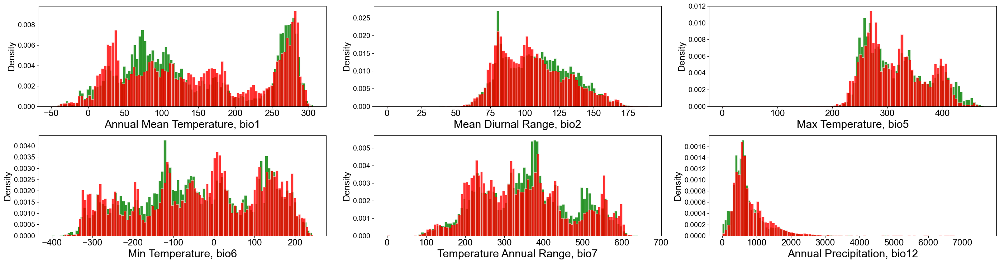

In [10]:
# Plot biovariables distributions only among objects whose class (crop/non-crop) have changed between 2 datasets
plotting.plot_biovars_dist_changed(Climate_train, LC_train, LC_test)

## Model

Here one creates the model for crop land classification and sets XGBClassification model parameters.

Since we already fit it for the years defined above, we saved it in .pkl files included in the repository.

Alternatively, you may vary years fed to the model and use them for fitting.

In [8]:
# Load models if they exist
try: 
    model_climate_loaded = XGBClassifier()
    with open("model_climate.pkl","rb") as fp:
        model_climate_loaded = pickle.load(fp)

    model_climate_lc_loaded = XGBClassifier()
    with open("model_climate_lc.pkl","rb") as fp:
        model_climate_lc_loaded = pickle.load(fp)

except:
    model_climate_loaded = None
    model_climate_lc_loaded = None

from crop_classifier import classifier
params_xgbс = {
    'learning_rate': 0.02,
    'n_estimators': 200,
    'objective': 'binary:logistic',
    'nthread': -1,
    'max_depth': 5,
    'use_label_encoder':False,
    'reg_alpha': 0.1,
    'reg_lambda': 1
    } 

Next, we train 2 models with slightly different set of features. Every model yields its classification scores and the plot showing the areas wrongly classified on test data.

________________________________________________
Model with features ['bio12', 'bio1', 'bio5', 'elv']
RA_score = 0.9138581150605489
threshold = 0.25412816
recall_score = 0.7383795151897992
precision_score = 0.4571864530234312
balanced_accuracy_score = 0.815661653995188


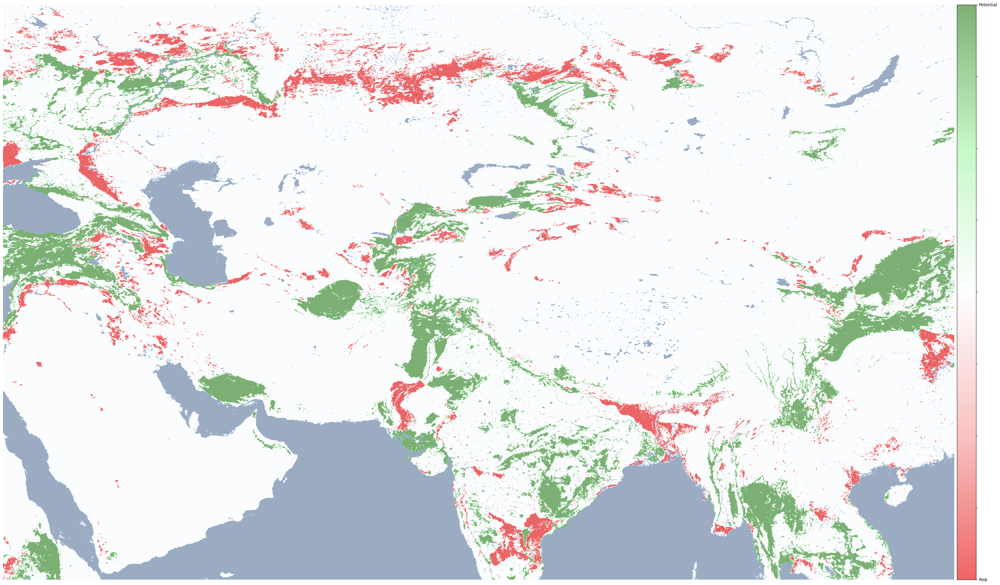

In [67]:
# Climate model

# Define set of features to use in model
set_climate = ['bio12', 'bio1', 'bio5', 'elv']
model_shell = classifier(model_climate_loaded)
model_climate = model_shell.model(**params_xgbс)
model_shell.collect_data(Climate_train, Climate_test, Elv, LC_feature_train, LC_feature_test, LC_train, LC_test, years_train, years_test, set_climate)
model_shell.fit_classifier()

# Save model (rewrites file only if rewrite == True)
model_shell.save("model_climate.pkl", rewrite = False)
model_climate_scores = model_shell.scores()

# Misclassified areas on the map
plotting.plot_trend_global(path, model_shell, params_xgbс, model_shell.y_test, X = model_shell.X_test)

________________________________________________
Model with features ['bio12', 'bio1', 'bio5', 'elv', 'lc']
RA_score = 0.9893109169089582
threshold = 0.64821786
recall_score = 0.9452872189324493
precision_score = 0.9451889001093045
balanced_accuracy_score = 0.9692965873389717


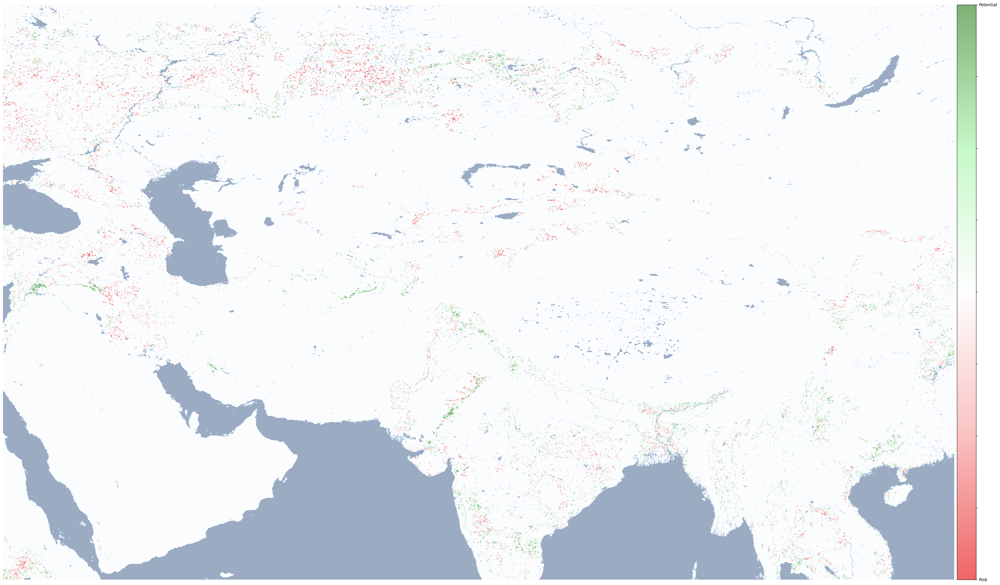

In [34]:
# Climate model with memory

# Define set of features to use in model
set_climate_lc = ['bio12', 'bio1', 'bio5', 'elv', 'lc']
model_shell = classifier(model_climate_lc_loaded)
model_climate_lc = model_shell.model(**params_xgbс)
model_shell.collect_data(Climate_train, Climate_test, Elv, LC_feature_train, LC_feature_test, LC_train, LC_test, years_train, years_test, set_climate_lc)
model_shell.fit_classifier()

# Save model (rewrites file only if rewrite == True)
model_shell.save("model_climate_lc.pkl", rewrite = False)
model_climate_lc_scores = model_shell.scores()

# Misclassified areas on the map
plotting.plot_trend_global(path, model_shell, params_xgbс, model_shell.y_test, X = model_shell.X_test)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


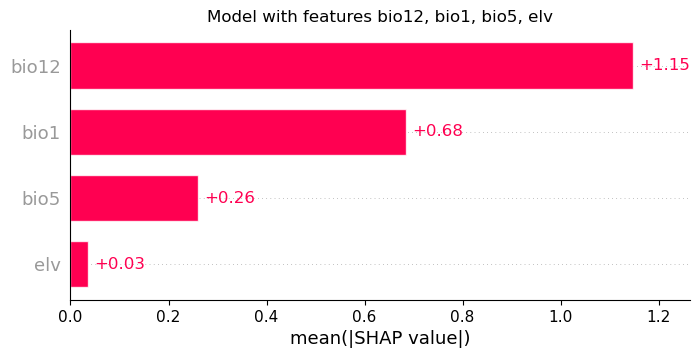

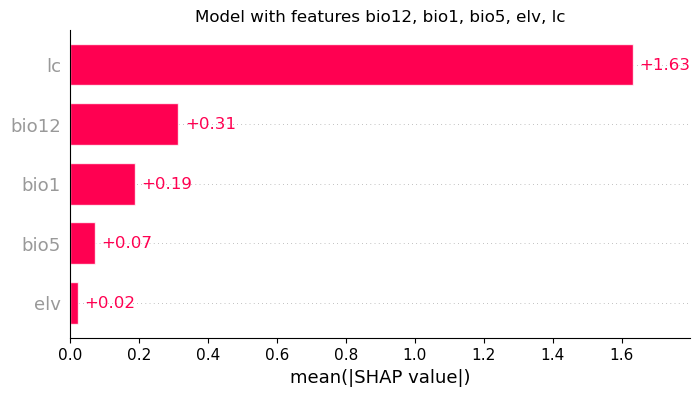

In [19]:
# Plot feature importances for the models
plotting.plot_shap(model_climate, Climate_train, Elv, LC_feature_train, LC_train, years_train, set_climate)
plotting.plot_shap(model_climate_lc, Climate_train, Elv, LC_feature_train, LC_train, years_train, set_climate_lc)

Figure above demonstrates that land memory becomes the most important feature in the climate model with memory, outweighing climatic factors. This suggests that the historical use or lack of cultivation of the land has a greater impact on crop yield than climate factors alone. The comparison of two models allows to identify the areas where present-day agricultural practices are no longer ecologically advantageous. Conversely, it also reveals areas where crop production is favored by climate change, and cultivation can be initiated with positive environmental outcomes.

## Make prediction

With the fitted model it is possible to make a prediction for future with available future global climate projections. Figure below compares prediction made with climate model with memory and the baseline (i.e. test data). In other words it shows risky and potentially succesful areas.
This picture will be saved in `path/Geo_pics` folder.

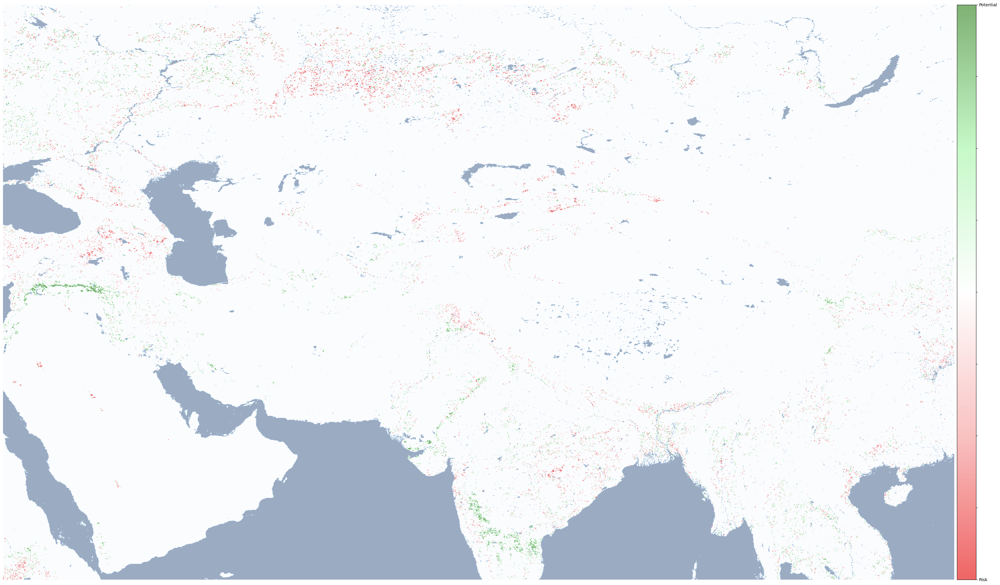

In [62]:
proba_future, y_test, _, _ = utils.avg_future_pred(Climate_future, years_future, LC_feature_future, Elv, LC_test, model_climate_lc, set_climate_lc)
plotting.plot_trend_global(path, model_shell, params_xgbс, model_shell.y_test, proba = proba_future)

With the created global picture we are able to evaluate changes on country level. Literally speaking, we crop the file with the borders available through GADM dataset for the countries listed below. This procedure was run for both climate model and climate model with memory.

Thus it is possible to calculate expected positive and negative share of crop lands in future year.

In [63]:
# Save all changes to raster
utils.changes2raster (model_climate, 'model_climate', set_climate, Elv, LC_feature_future, Climate_future, LC_test, 
                      years_test, year_start_future+lag, path, path_pics, model_climate_scores['threshold'])
utils.changes2raster (model_climate_lc, 'model_climate_lc', set_climate_lc, Elv, LC_feature_future, Climate_future, LC_test,
                      years_test, year_start_future+lag, path, path_pics, model_climate_lc_scores['threshold'])

In [64]:
# Define countries and their prefixes
country_names = ['Azerbaijan', 'Cambodia',   'Japan',
                'Kazakhstan', 'Kyrgyzstan', 'Myanmar', 
                'Philippines', 'Korea', 'Turkey', 
                'Thailand', 'Uzbekistan', 'Viet Nam']
prefixes = [ 'AZE', 'KHM',  'JPN',
            'KAZ', 'KGZ', 'MMR',
            'PHL', 'KOR', 'TUR',
            'THA', 'UZB', 'VNM']

# Create cropped tiffs for every country in the list
utils.crop_country ('model_climate', prefixes, country_names, path, path_pics, year_start_future+lag)
utils.crop_country ('model_climate_lc', prefixes, country_names, path, path_pics, year_start_future+lag)

Azerbaijan


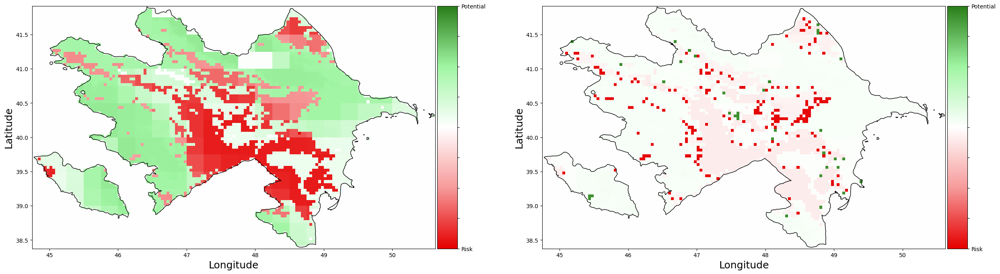

Cambodia


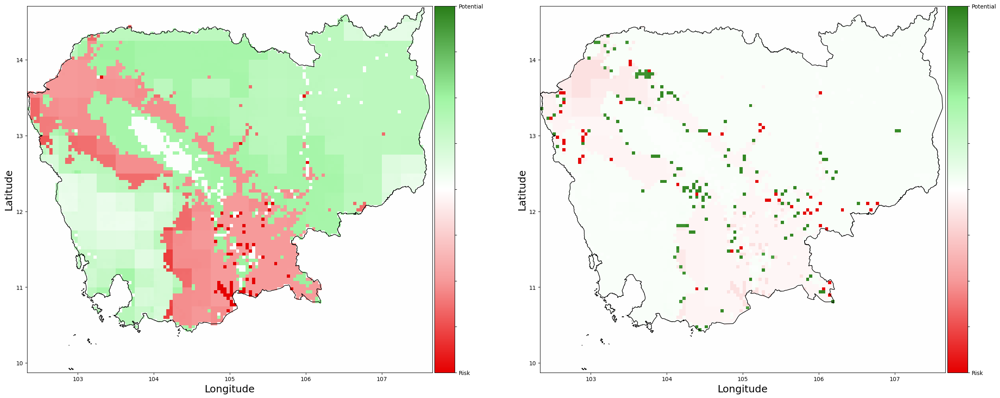

Japan


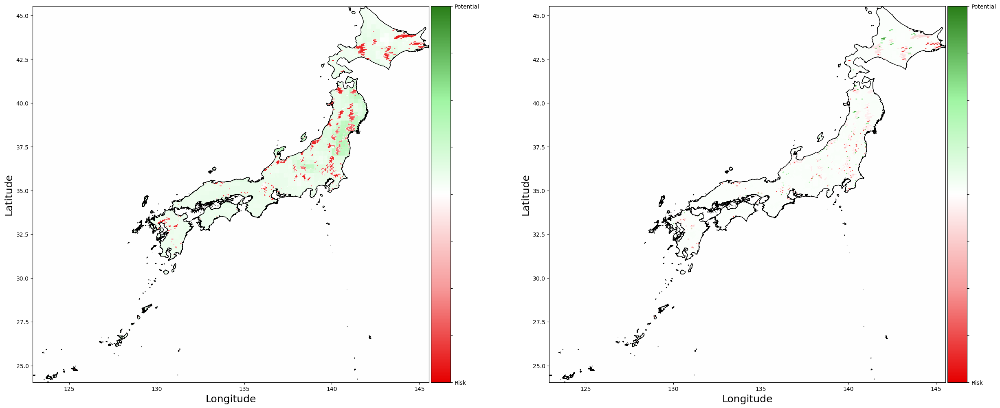

Kazakhstan


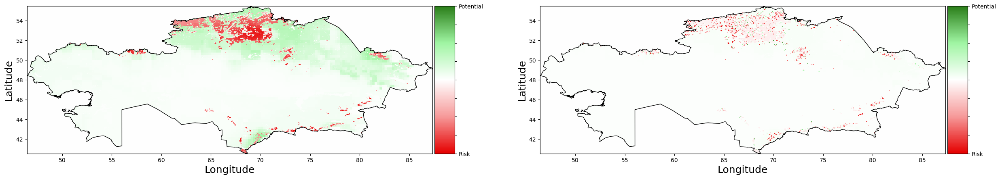

Kyrgyzstan


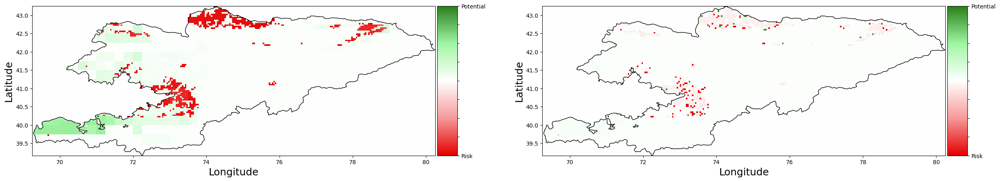

Myanmar


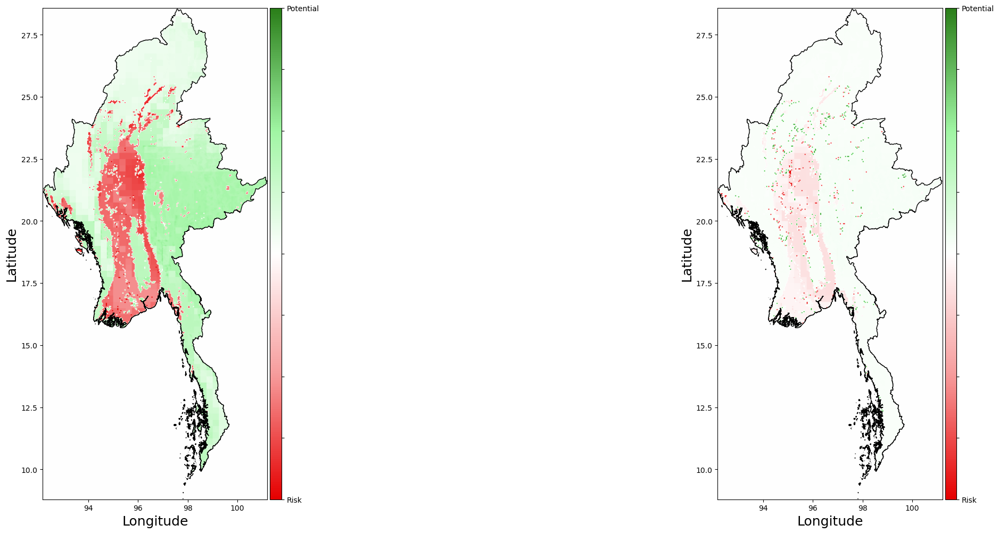

Philippines


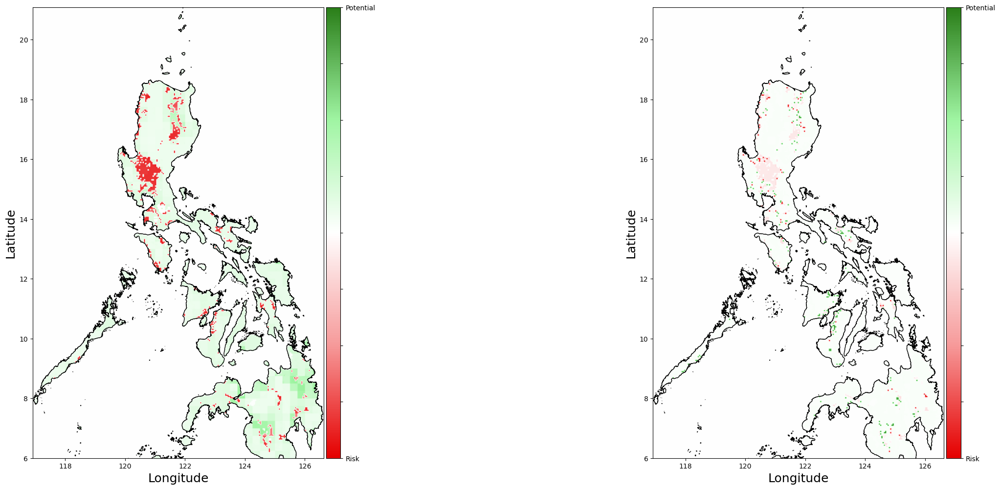

Korea


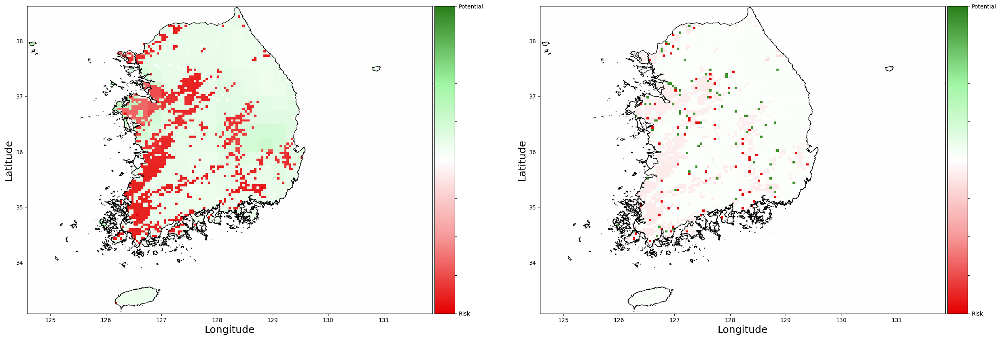

Turkey


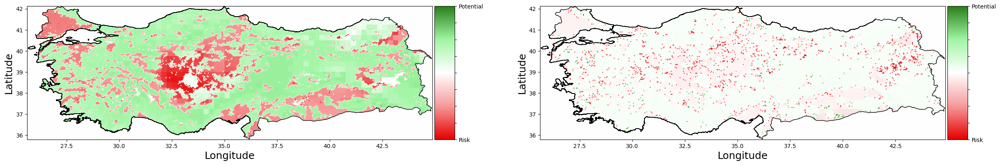

Thailand


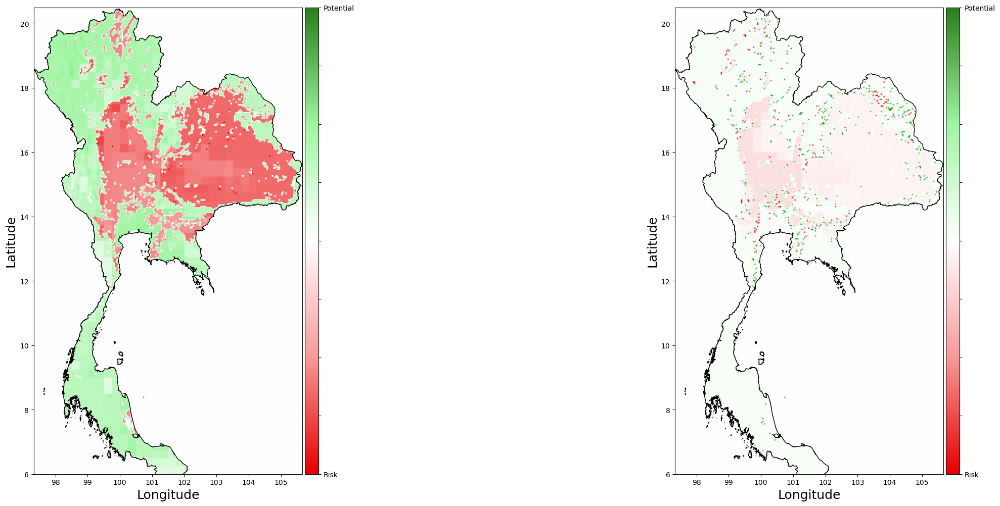

Uzbekistan


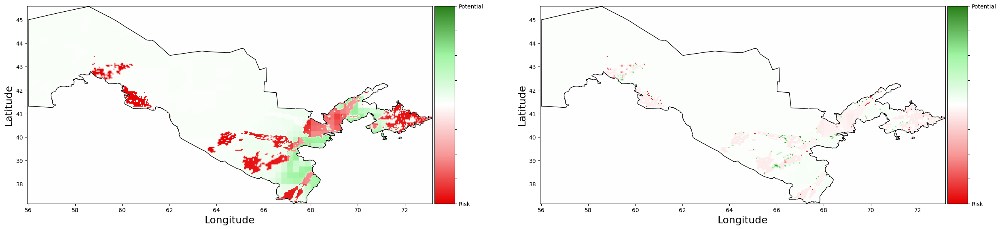

Viet Nam


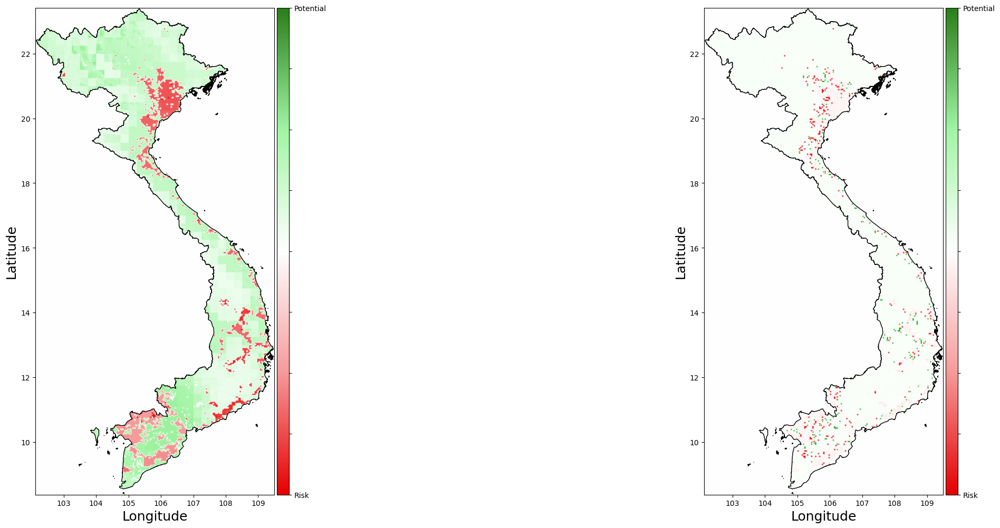

In [65]:
# Plot changes to be expected in future comparing with test year
positive, negative = plotting.plot_trend('model_climate', 'model_climate_lc', prefixes, country_names, year_start_future+lag, path, path_pics)

In [66]:
# Save crop changes expectations in separate file
with open("crops_disappear_{}_{}.pickle".format(year_start_test, year_start_future+lag), 'wb') as handle:
    pickle.dump(negative, handle, protocol=pickle.HIGHEST_PROTOCOL)
negative

{'AZE': 13.2,
 'KHM': 2.3,
 'JPN': 10.4,
 'KAZ': 16.4,
 'KGZ': 11.8,
 'MMR': 3.2,
 'PHL': 7.4,
 'KOR': 6.5,
 'TUR': 9.7,
 'THA': 1.9,
 'UZB': 2.4,
 'VNM': 11.9}